<a href="https://colab.research.google.com/github/phoebe-alexis/COVID_Prediction/blob/main/python_lab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files

# Upload the ZIP file
uploaded = files.upload()


In [ ]:
import zipfile
import os

# Specify the uploaded ZIP file name
zip_file_name = "cb_2018_us_state_500k.zip"

# Extract the shapefile
with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
    zip_ref.extractall("shapefile_data")

# Verify extracted files
print(os.listdir("shapefile_data"))


['cb_2018_us_state_500k.cpg', 'cb_2018_us_state_500k.shp.iso.xml', 'cb_2018_us_state_500k.shx', 'cb_2018_us_state_500k.dbf', 'cb_2018_us_state_500k.shp.ea.iso.xml', 'cb_2018_us_state_500k.prj', 'cb_2018_us_state_500k.shp']


In [ ]:
!pip install geopandas matplotlib


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value 

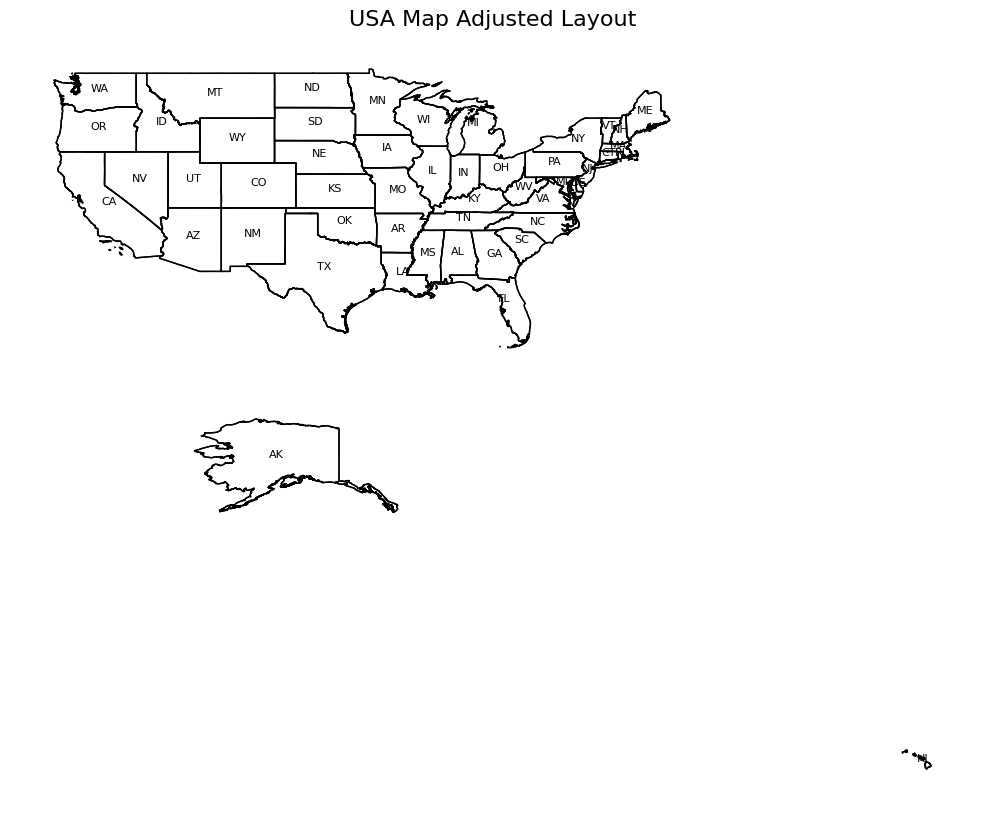

In [ ]:
# Install required libraries
!pip install geopandas shapely matplotlib

# Import necessary libraries
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import MultiPolygon, Polygon
import pandas as pd

# Step 1: Load the shapefile
shapefile_path = "shapefile_data/cb_2018_us_state_500k.shp"
usa_states = gpd.read_file(shapefile_path)

# Step 2: Filter Mainland USA
mainland_states = [
    "AL", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", "GA",
    "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD",
    "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH",
    "NJ", "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA",
    "RI", "SC", "SD", "TN", "TX", "UT", "VT", "VA", "WA",
    "WV", "WI", "WY"
]
mainland_usa = usa_states[usa_states["STUSPS"].isin(mainland_states)]

# Step 3: Filter Alaska (Keep only the largest polygon)
def keep_largest_polygon(geometry):
    if isinstance(geometry, MultiPolygon):
        # Find the largest polygon by area
        largest_polygon = max(geometry.geoms, key=lambda poly: poly.area)
        return largest_polygon
    elif isinstance(geometry, Polygon):
        return geometry  # If it's already a Polygon, keep it
    return None

alaska = usa_states[usa_states["STUSPS"] == "AK"]
alaska["geometry"] = alaska["geometry"].apply(keep_largest_polygon)

# Step 4: Filter Hawaii (Remove smaller islands)
def filter_large_geometries(geometry, min_area=0.01):
    if isinstance(geometry, MultiPolygon):
        # Keep only polygons with area greater than the threshold
        large_polygons = [poly for poly in geometry.geoms if poly.area > min_area]
        return MultiPolygon(large_polygons) if large_polygons else None
    elif isinstance(geometry, Polygon) and geometry.area > min_area:
        return geometry
    return None

hawaii = usa_states[usa_states["STUSPS"] == "HI"]
hawaii["geometry"] = hawaii["geometry"].apply(filter_large_geometries)
hawaii = hawaii[~hawaii["geometry"].isna()]

# Step 5: Transform Alaska and Hawaii to fit on the map
# Adjust Alaska's position and scale
alaska["geometry"] = alaska["geometry"].translate(xoff=-55, yoff=-35).scale(0.5, 0.5, origin=(0, 0))

# Adjust Hawaii's position and scale
hawaii["geometry"] = hawaii["geometry"].translate(xoff=70, yoff=-45).scale(0.5, 0.5, origin=(0, 0))

# Step 6: Combine the datasets
all_states_adjusted = gpd.GeoDataFrame(pd.concat([mainland_usa, alaska, hawaii], ignore_index=True))

# Ensure all geometries are valid (filter out None geometries)
all_states_adjusted = all_states_adjusted[~all_states_adjusted["geometry"].isna()]

# Step 7: Plot the combined map
fig, ax = plt.subplots(figsize=(15, 10))

# Plot all states
all_states_adjusted.boundary.plot(ax=ax, linewidth=1, color="black")
all_states_adjusted.plot(ax=ax, color="white", edgecolor="black")

# Add state abbreviations for readability
for idx, row in all_states_adjusted.iterrows():
    if row["geometry"] is not None:  # Check if geometry is valid
        x, y = row["geometry"].centroid.coords[0]
        ax.text(x, y, row["STUSPS"], fontsize=8, ha="center", color="black")

# Style the plot
ax.set_title("USA Map Adjusted Layout", fontsize=16)
ax.axis("off")  # Turn off axes for a cleaner appearance

plt.show()


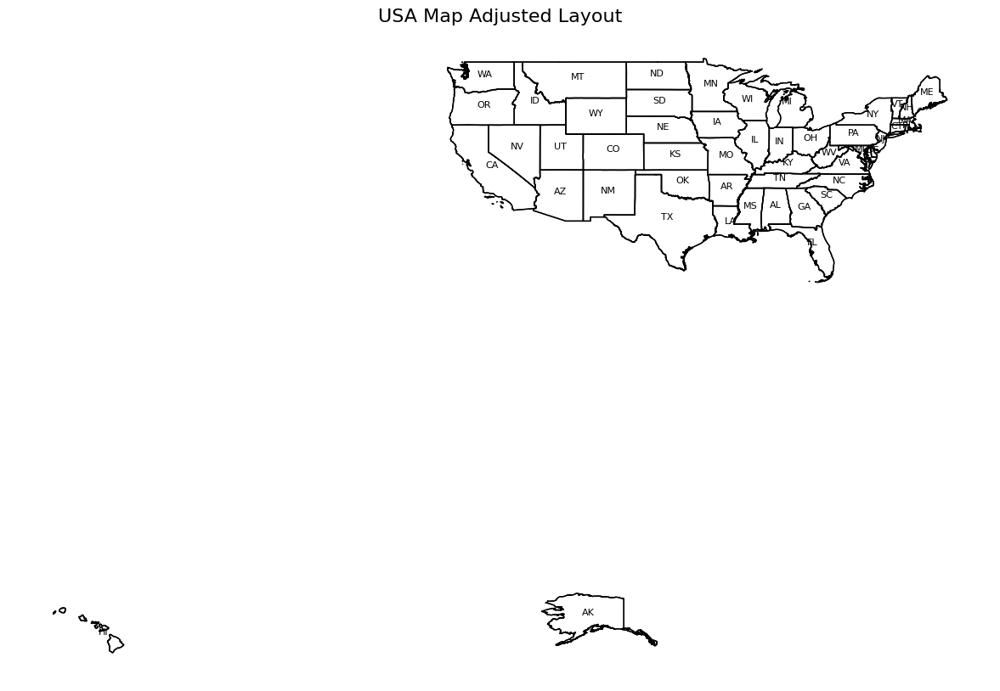

In [ ]:
# Install required libraries
!pip install geopandas shapely matplotlib

# Import necessary libraries
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import MultiPolygon, Polygon
from shapely.affinity import scale, translate
import pandas as pd

# Step 1: Load the shapefile
shapefile_path = "shapefile_data/cb_2018_us_state_500k.shp"
usa_states = gpd.read_file(shapefile_path)

# Step 2: Filter Mainland USA
mainland_states = [
    "AL", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", "GA",
    "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD",
    "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH",
    "NJ", "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA",
    "RI", "SC", "SD", "TN", "TX", "UT", "VT", "VA", "WA",
    "WV", "WI", "WY"
]
mainland_usa = usa_states[usa_states["STUSPS"].isin(mainland_states)]

# Step 3: Filter Alaska (Keep only the largest polygon)
def keep_largest_polygon(geometry):
    if isinstance(geometry, MultiPolygon):
        largest_polygon = max(geometry.geoms, key=lambda poly: poly.area)
        return largest_polygon
    elif isinstance(geometry, Polygon):
        return geometry
    return None

alaska = usa_states[usa_states["STUSPS"] == "AK"].copy()
alaska["geometry"] = alaska["geometry"].apply(keep_largest_polygon)

# Step 4: Filter Hawaii (Remove smaller islands)
def filter_large_geometries(geometry, min_area=0.01):
    if isinstance(geometry, MultiPolygon):
        large_polygons = [poly for poly in geometry.geoms if poly.area > min_area]
        return MultiPolygon(large_polygons) if large_polygons else None
    elif isinstance(geometry, Polygon) and geometry.area > min_area:
        return geometry
    return None

hawaii = usa_states[usa_states["STUSPS"] == "HI"].copy()
hawaii["geometry"] = hawaii["geometry"].apply(filter_large_geometries)
hawaii = hawaii[~hawaii["geometry"].isna()]

# Step 5: Transform Alaska and Hawaii to fit on the map
# Adjust Alaska's position and scale
alaska["geometry"] = alaska["geometry"].apply(
    lambda geom: translate(scale(geom, xfact=0.35, yfact=0.35, origin=(0, 0)), xoff=-55, yoff=-35)
)

# Adjust Hawaii's position and scale
hawaii["geometry"] = hawaii["geometry"].apply(
    lambda geom: translate(scale(geom, xfact=1.5, yfact=1.5, origin=(0, 0)), xoff=70, yoff=-45)
)

# Step 6: Combine the datasets
all_states_adjusted = gpd.GeoDataFrame(pd.concat([mainland_usa, alaska, hawaii], ignore_index=True))

# Ensure all geometries are valid
all_states_adjusted = all_states_adjusted[~all_states_adjusted["geometry"].isna()]

# Step 7: Plot the combined map
fig, ax = plt.subplots(figsize=(15, 10))

# Plot all states
all_states_adjusted.boundary.plot(ax=ax, linewidth=1, color="black")
all_states_adjusted.plot(ax=ax, color="white", edgecolor="black")

# Add state abbreviations for readability
for idx, row in all_states_adjusted.iterrows():
    if row["geometry"] is not None:
        centroid = row["geometry"].centroid
        x, y = centroid.coords[0]
        ax.text(x, y, row["STUSPS"], fontsize=8, ha="center", color="black")

# Style the plot
ax.set_title("USA Map Adjusted Layout", fontsize=16)
ax.axis("off")

plt.show()


/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


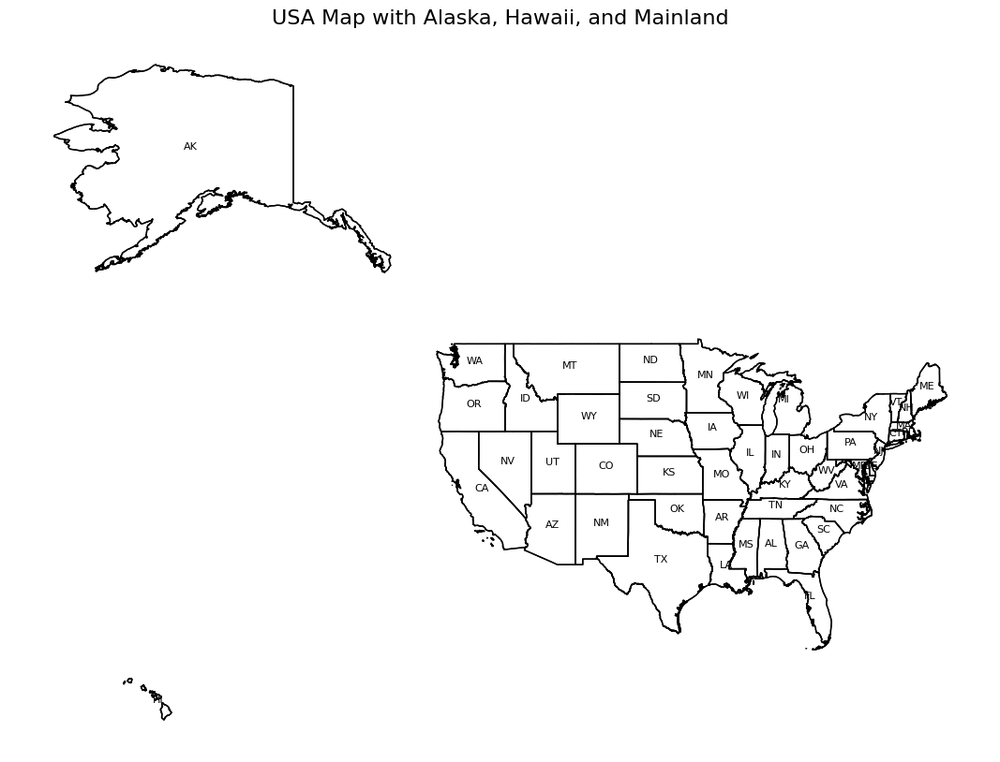

In [ ]:
# Install required libraries
!pip install geopandas matplotlib shapely

# Import necessary libraries
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import MultiPolygon, Polygon

# Load the shapefile
shapefile_path = "shapefile_data/cb_2018_us_state_500k.shp"
usa_states = gpd.read_file(shapefile_path)

# Filter Mainland USA states
mainland_states = [
    "AL", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", "GA",
    "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD",
    "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH",
    "NJ", "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA",
    "RI", "SC", "SD", "TN", "TX", "UT", "VT", "VA", "WA",
    "WV", "WI", "WY"
]
mainland_usa = usa_states[usa_states["STUSPS"].isin(mainland_states)]

# Filter Alaska (Keep only the largest polygon)
def keep_largest_polygon(geometry):
    if isinstance(geometry, MultiPolygon):
        largest_polygon = max(geometry.geoms, key=lambda poly: poly.area)
        return largest_polygon
    elif isinstance(geometry, Polygon):
        return geometry
    return None

alaska = usa_states[usa_states["STUSPS"] == "AK"]
alaska["geometry"] = alaska["geometry"].apply(keep_largest_polygon)

# Filter Hawaii (Remove smaller islands)
def filter_large_geometries(geometry, min_area=0.01):
    if isinstance(geometry, MultiPolygon):
        large_polygons = [poly for poly in geometry.geoms if poly.area > min_area]
        return MultiPolygon(large_polygons) if large_polygons else None
    elif isinstance(geometry, Polygon) and geometry.area > min_area:
        return geometry
    return None

hawaii = usa_states[usa_states["STUSPS"] == "HI"]
hawaii["geometry"] = hawaii["geometry"].apply(filter_large_geometries)
hawaii = hawaii[~hawaii["geometry"].isna()]

# Combine Mainland USA, Alaska, and Hawaii
filtered_usa = gpd.GeoDataFrame(pd.concat([mainland_usa, alaska, hawaii], ignore_index=True))

# Plot the filtered map
fig, ax = plt.subplots(figsize=(15, 10))
filtered_usa.boundary.plot(ax=ax, linewidth=1, color="black")
filtered_usa.plot(ax=ax, color="white", edgecolor="black")

# Add state abbreviations
for idx, row in filtered_usa.iterrows():
    if row["geometry"] is not None:  # Check if geometry is valid
        x, y = row["geometry"].centroid.coords[0]
        ax.text(x, y, row["STUSPS"], fontsize=8, ha="center", color="black")

# Style the plot
ax.set_title("USA Map with Alaska, Hawaii, and Mainland", fontsize=16)
ax.axis("off")  # Turn off axes for a cleaner appearance

plt.show()


In [ ]:
# Install necessary libraries
!pip install pandas geopandas

# Import required libraries
import pandas as pd
from google.colab import files

# Upload the CSV file
print("Please upload your CSV file...")
uploaded = files.upload()

# Extract the filename
file_name = list(uploaded.keys())[0]  # Get the uploaded file's name
print(f"Uploaded file: {file_name}")

# Load the CSV file
covid_data = pd.read_csv(file_name)

# Display the first few rows to understand the structure
print(covid_data.head())

# Aggregate case counts at the state level
# Summing up all counties within each state for all time periods
state_aggregated = covid_data.groupby("Province_State").sum(numeric_only=True)

# Drop unnecessary columns (if any, like latitude and longitude)
columns_to_drop = ["UID", "iso2", "iso3", "code3", "FIPS", "Admin2", "Lat", "Long_"]
state_aggregated = state_aggregated.drop(columns=columns_to_drop, errors="ignore")

# Display the aggregated dataset
print(state_aggregated)

# Save the aggregated data to a CSV file (optional)
state_aggregated.to_csv("aggregated_state_covid_cases.csv")
print("Aggregated data saved as 'aggregated_state_covid_cases.csv'")


Please upload your CSV file...


Saving time_series_covid19_confirmed_US.csv to time_series_covid19_confirmed_US.csv
Uploaded file: time_series_covid19_confirmed_US.csv
        UID iso2 iso3  code3    FIPS   Admin2 Province_State Country_Region  \
0  84001001   US  USA    840  1001.0  Autauga        Alabama             US   
1  84001003   US  USA    840  1003.0  Baldwin        Alabama             US   
2  84001005   US  USA    840  1005.0  Barbour        Alabama             US   
3  84001007   US  USA    840  1007.0     Bibb        Alabama             US   
4  84001009   US  USA    840  1009.0   Blount        Alabama             US   

         Lat      Long_  ... 2/28/23  3/1/23  3/2/23  3/3/23  3/4/23  3/5/23  \
0  32.539527 -86.644082  ...   19732   19759   19759   19759   19759   19759   
1  30.727750 -87.722071  ...   69641   69767   69767   69767   69767   69767   
2  31.868263 -85.387129  ...    7451    7474    7474    7474    7474    7474   
3  32.996421 -87.125115  ...    8067    8087    8087    8087    8087 

/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.10/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
<ipython-input-8-d9462f690b4b>:72: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the oth

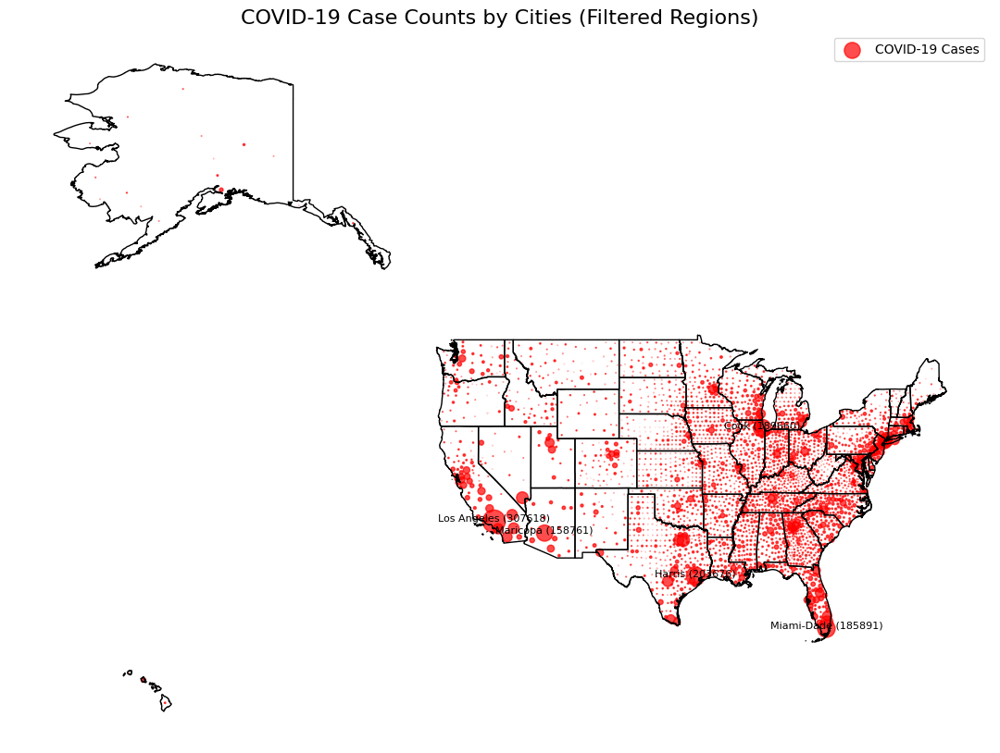

In [ ]:
# Install required libraries
!pip install geopandas pandas matplotlib shapely

# Import necessary libraries
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import MultiPolygon, Polygon, Point

# Step 1: Load the shapefile for states
shapefile_path = "shapefile_data/cb_2018_us_state_500k.shp"  # Update to your shapefile path
usa_states = gpd.read_file(shapefile_path)

# Step 2: Filter Mainland USA, Alaska, and Hawaii, removing smaller regions
mainland_states = [
    "AL", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", "GA",
    "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD",
    "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH",
    "NJ", "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA",
    "RI", "SC", "SD", "TN", "TX", "UT", "VT", "VA", "WA",
    "WV", "WI", "WY"
]

def keep_largest_polygon(geometry):
    if isinstance(geometry, MultiPolygon):
        largest_polygon = max(geometry.geoms, key=lambda poly: poly.area)
        return largest_polygon
    elif isinstance(geometry, Polygon):
        return geometry
    return None

def filter_large_geometries(geometry, min_area=0.01):
    if isinstance(geometry, MultiPolygon):
        large_polygons = [poly for poly in geometry.geoms if poly.area > min_area]
        return MultiPolygon(large_polygons) if large_polygons else None
    elif isinstance(geometry, Polygon) and geometry.area > min_area:
        return geometry
    return None

# Filter mainland USA
mainland_usa = usa_states[usa_states["STUSPS"].isin(mainland_states)]

# Filter Alaska
alaska = usa_states[usa_states["STUSPS"] == "AK"]
alaska["geometry"] = alaska["geometry"].apply(keep_largest_polygon)

# Filter Hawaii
hawaii = usa_states[usa_states["STUSPS"] == "HI"]
hawaii["geometry"] = hawaii["geometry"].apply(filter_large_geometries)
hawaii = hawaii[~hawaii["geometry"].isna()]

# Combine Mainland USA, Alaska, and Hawaii
filtered_usa = gpd.GeoDataFrame(pd.concat([mainland_usa, alaska, hawaii], ignore_index=True))

# Step 3: Load the COVID-19 data
covid_data_path = "time_series_covid19_confirmed_US.csv"  # Update with your file path
covid_data = pd.read_csv(covid_data_path)

# Step 4: Filter out cases from smaller regions
columns_to_keep = ["Admin2", "Province_State", "Lat", "Long_", "10/31/20"]
covid_cities = covid_data[columns_to_keep]

# Create a GeoDataFrame for COVID-19 data
gdf_cities = gpd.GeoDataFrame(
    covid_cities,
    geometry=gpd.points_from_xy(covid_cities["Long_"], covid_cities["Lat"]),
    crs="EPSG:4326"
)

# Perform a spatial join to filter points within valid regions
valid_regions = filtered_usa[["geometry"]]
filtered_covid_data = gpd.sjoin(gdf_cities, valid_regions, how="inner", predicate="within")

# Step 5: Plot the map
fig, ax = plt.subplots(figsize=(15, 10))

# Plot state boundaries
filtered_usa.boundary.plot(ax=ax, color="black", linewidth=1)

# Plot cities with case counts
filtered_covid_data.plot(
    ax=ax,
    markersize=filtered_covid_data["10/31/20"] / 1000,  # Scale marker size by case counts
    color="red",
    alpha=0.7,
    label="COVID-19 Cases"
)

# Add annotations for cities with high case counts
for idx, row in filtered_covid_data.iterrows():
    if row["10/31/20"] > 100000:  # Add labels for cities with cases > 100,000
        ax.text(
            row.geometry.x,
            row.geometry.y,
            f"{row['Admin2']} ({int(row['10/31/20'])})",
            fontsize=8,
            ha="center"
        )

# Style the plot
ax.set_title("COVID-19 Case Counts by Cities (Filtered Regions)", fontsize=16)
ax.axis("off")  # Turn off axes for a cleaner appearance

plt.legend()
plt.show()


In [ ]:
# Install required libraries
!pip install geopandas matplotlib shapely pandas

# Import necessary libraries
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import MultiPolygon, Polygon
import pandas as pd
import os

# Load shapefile
shapefile_path = "shapefile_data/cb_2018_us_state_500k.shp"
usa_states = gpd.read_file(shapefile_path)

# Load COVID-19 data
csv_file = "time_series_covid19_confirmed_US.csv"
covid_data = pd.read_csv(csv_file)

# Filter Mainland USA states
mainland_states = [
    "AL", "AZ", "AR", "CA", "CO", "CT", "DE", "FL", "GA",
    "ID", "IL", "IN", "IA", "KS", "KY", "LA", "ME", "MD",
    "MA", "MI", "MN", "MS", "MO", "MT", "NE", "NV", "NH",
    "NJ", "NM", "NY", "NC", "ND", "OH", "OK", "OR", "PA",
    "RI", "SC", "SD", "TN", "TX", "UT", "VT", "VA", "WA",
    "WV", "WI", "WY"
]
mainland_usa = usa_states[usa_states["STUSPS"].isin(mainland_states)]

# Filter Alaska (Keep only the largest polygon)
def keep_largest_polygon(geometry):
    if isinstance(geometry, MultiPolygon):
        largest_polygon = max(geometry.geoms, key=lambda poly: poly.area)
        return largest_polygon
    elif isinstance(geometry, Polygon):
        return geometry
    return None

alaska = usa_states[usa_states["STUSPS"] == "AK"]
alaska["geometry"] = alaska["geometry"].apply(keep_largest_polygon)

# Filter Hawaii (Remove smaller islands)
def filter_large_geometries(geometry, min_area=0.01):
    if isinstance(geometry, MultiPolygon):
        large_polygons = [poly for poly in geometry.geoms if poly.area > min_area]
        return MultiPolygon(large_polygons) if large_polygons else None
    elif isinstance(geometry, Polygon) and geometry.area > min_area:
        return geometry
    return None

hawaii = usa_states[usa_states["STUSPS"] == "HI"]
hawaii["geometry"] = hawaii["geometry"].apply(filter_large_geometries)
hawaii = hawaii[~hawaii["geometry"].isna()]

# Combine Mainland USA, Alaska, and Hawaii
filtered_usa = gpd.GeoDataFrame(pd.concat([mainland_usa, alaska, hawaii], ignore_index=True))

# Create GeoDataFrame for COVID-19 data with coordinates
gdf_cities = gpd.GeoDataFrame(
    covid_data,
    geometry=gpd.points_from_xy(covid_data.Long_, covid_data.Lat),
    crs="EPSG:4326"
)

# Filter COVID-19 data to include only cities within valid regions
valid_regions = filtered_usa[~filtered_usa["geometry"].isna()]
filtered_covid_data = gpd.sjoin(gdf_cities, valid_regions, how="inner", predicate="within")

# Create output directory for maps
output_folder = "output_maps"
os.makedirs(output_folder, exist_ok=True)

# Generate maps for each date column
date_columns = covid_data.columns[11:]  # Assuming date columns start from column 12
for date in date_columns:
    fig, ax = plt.subplots(figsize=(15, 10))

    # Plot the filtered states
    valid_regions.boundary.plot(ax=ax, linewidth=1, color="black")

    # Plot the filtered cities with case counts
    filtered_covid_data.plot(
        ax=ax,
        color="red",
        markersize=filtered_covid_data[date] / 1000,  # Scale marker size by case counts
        alpha=0.6,
        label="COVID-19 Cases"
    )

    # Add a title
    ax.set_title(f"COVID-19 Case Counts by Cities ({date})", fontsize=16)
    ax.axis("off")
    plt.legend(loc="upper right")

    # Save the map as an image
    output_file = f"{output_folder}/map_{date.replace('/', '-')}.png"  # Replace '/' with '-' for file names
    plt.savefig(output_file, bbox_inches="tight")
    plt.close()

print(f"Maps saved in folder: {output_folder}")


/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
/usr/local/lib/python3.11/dist-packages/geopandas/geodataframe.py:1819: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)
<ipython-input-4-4c659a06b70a>:67: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the oth

Maps saved in folder: output_maps


In [ ]:
import imageio
import os

# Ensure the folder with images exists
output_folder = "output_maps"

# Extract the list of dates from the dataset columns
dates = covid_data.columns[11:]  # Assuming the date columns start at column 12

# Create a GIF from the saved images
images = []
for date in dates:
    image_path = f"{output_folder}/map_{date.replace('/', '-')}.png"  # Ensure correct file paths
    if os.path.exists(image_path):  # Check if the image exists
        images.append(imageio.imread(image_path))

# Save the GIF
gif_output_path = "covid_progression.gif"
imageio.mimsave(gif_output_path, images, fps=4)  # Adjust FPS for speed
print(f"GIF saved as {gif_output_path}")


<ipython-input-5-fe97e51022f2>:15: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  images.append(imageio.imread(image_path))


GIF saved as covid_progression.gif


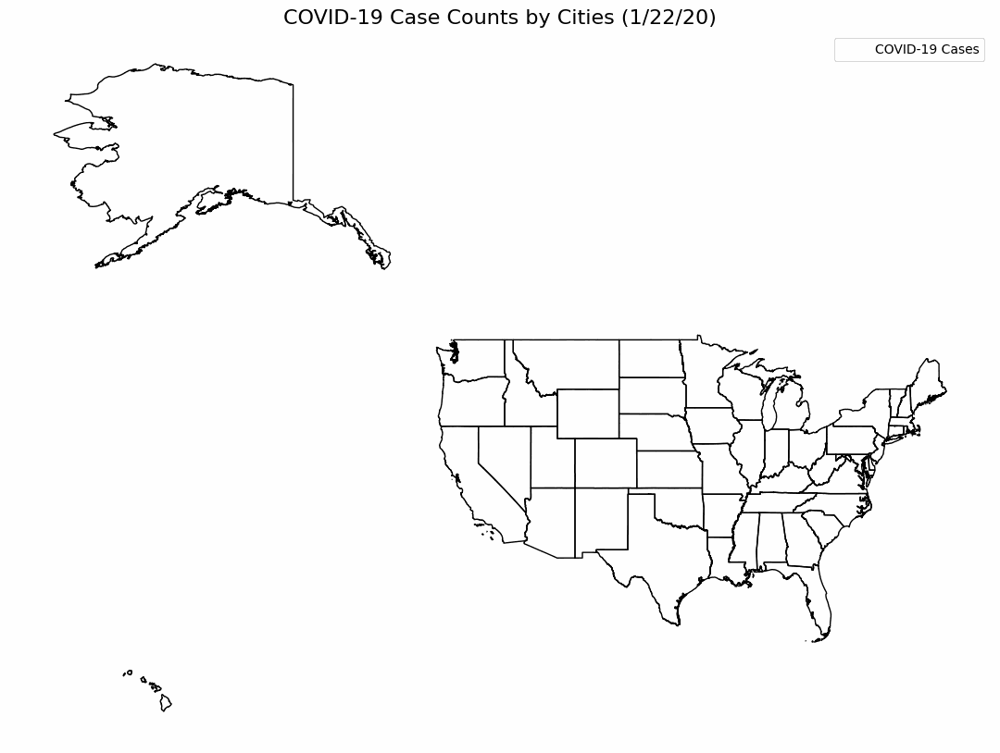

In [ ]:
from IPython.display import Image, display

# Display the GIF
display(Image(filename="covid_progression.gif"))


In [ ]:
pip install plotly


In [ ]:
import imageio
import os
from PIL import Image
import plotly.graph_objects as go

# Step 1: Folder with saved images
output_folder = "output_maps"

# Extract the list of dates from the dataset columns
dates = covid_data.columns[11:]  # Assuming the date columns start at column 12

# Verify images exist and sort dates
images = []
sorted_dates = []
for date in dates:
    image_path = f"{output_folder}/map_{date.replace('/', '-')}.png"
    if os.path.exists(image_path):  # Check if the image exists
        images.append(image_path)
        sorted_dates.append(date)

# Step 2: Create a Plotly figure
fig = go.Figure()

for i, image_path in enumerate(images):
    img = Image.open(image_path)
    fig.add_trace(go.Image(z=img))
    # Set the visibility for frames in the slider
    fig.data[-1].update(visible=(i == 0))  # Only the first image is visible initially

# Step 3: Configure the slider
steps = []
for i, date in enumerate(sorted_dates):
    step = dict(
        method="update",
        args=[{"visible": [j == i for j in range(len(images))]}],  # Toggle visibility
        label=date,
    )
    steps.append(step)

sliders = [dict(
    active=0,
    steps=steps,
    x=0.1,
    len=0.9,
    pad={"b": 10},
    currentvalue={"prefix": "Date: ", "font": {"size": 20}},
)]

# Step 4: Add layout for the slider
fig.update_layout(
    sliders=sliders,
    title="COVID-19 Case Progression by Date",
    width=1000,
    height=800,
)

# Step 5: Save the interactive HTML
html_output_path = "stacked_maps_with_slider.html"
fig.write_html(html_output_path)

print(f"Interactive map saved to {html_output_path}")


In [ ]:
import webbrowser
import os

# Path to the generated HTML file
output_html = "stacked_maps_with_slider.html"

# Check if the file exists and open it
if os.path.exists(output_html):
    webbrowser.open(f"file://{os.path.abspath(output_html)}")
else:
    print(f"The file {output_html} does not exist.")
